In [1]:
import sys
sys.path.insert(0, './SetXAI/')
import torch
import torch.nn as nn
import torch.nn.functional as F
from src.utils import *
from src.dspn import *
from src.model import *
from data.MnistSet import *
from time import sleep
from tqdm import tqdm
from torch.utils.data import DataLoader, Dataset, TensorDataset
from data .Modelnet10toSet import *
from data .pointcloud_utils import *
from torch.utils.data import DataLoader, Dataset, TensorDataset
from data .Modelnet10toSet import *
from data .pointcloud_utils import *
import matplotlib.pyplot as plt
import random
import matplotlib.pyplot as plt
import random
from src.utils import *
from src.model import *
from data.MnistSet import *
from time import sleep
from tqdm import tqdm

In [2]:
!pwd
%cd ..
%cd ..
%cd visualisation

/Users/ahmedbegga/Desktop/TFG-Ahmed/SetXAI/Tutorials/DeepSets  PointCloud
/Users/ahmedbegga/Desktop/TFG-Ahmed/SetXAI/Tutorials
/Users/ahmedbegga/Desktop/TFG-Ahmed/SetXAI
/Users/ahmedbegga/Desktop/TFG-Ahmed/SetXAI/visualisation


In [3]:
train_data = PointCloudData()
test_data = PointCloudData(None, Train=False, folder='test', transform=None)
train_loader = DataLoader(train_data, batch_size=32,shuffle=True)
test_loader = DataLoader(test_data, batch_size=32,shuffle=True)

In [4]:
dataset = PointCloudData()
class_names =   [ 'bathtub' , 'bed' , 'chair',  'desk' , 'dresser' , 'monitor' , 'night_stand' , 'sofa' ,  'table' ,  'toilet']
class_names2 = [torch.Tensor(0),torch.Tensor(1),torch.Tensor(2),torch.Tensor(0),torch.Tensor(3),torch.Tensor(4),torch.Tensor(5),torch.Tensor(6),torch.Tensor(7),torch.Tensor(8),torch.Tensor(9)]
sampleSet = []
sampleSetDSPN = []
sampleMaskDSPN = []
for i in range(0,len(class_names)):
    for j in range(0,len(dataset)):
        if i == dataset[j]['category']:
            sampleSet.append(dataset[j]['pointcloud'])
            sampleSetDSPN.append(dataset[j]['pointcloud'].unsqueeze(0))
            sampleMaskDSPN.append(dataset[j]['mask'].unsqueeze(0))
            break

Tamaño del dataset:  3991
Numero de elementos por muestra:  3 que se corresponde con la etiqueta, el conjunto de puntos y la mascara
Tamaño del conjunto de puntos:  (3, 2048)
Representación del conjunto de puntos: 


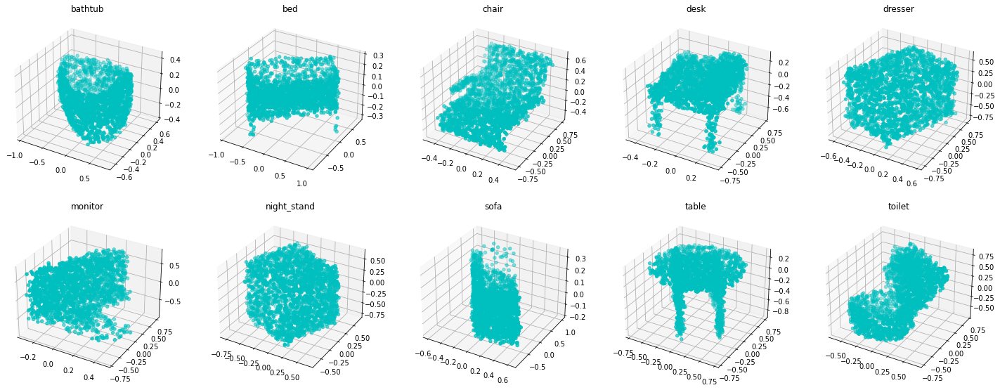

In [5]:
print('Tamaño del dataset: ',len(dataset))
print('Numero de elementos por muestra: ',len(dataset[0]),'que se corresponde con la etiqueta, el conjunto de puntos y la mascara')
print('Tamaño del conjunto de puntos: ',dataset[0]['pointcloud'].numpy().shape)
print('Representación del conjunto de puntos: ')
fig = plt.figure(figsize=(25, 25))
for i in range(10):
    ax = fig.add_subplot(5,5,i+1, projection='3d')
    s = sampleSet[i]
    # plot a 3D surface like in the example mplot3d/surface3d_demo
    surf = ax.scatter(s[0,:].numpy(), s[1,:].numpy(), s[2, :].numpy(),color='c',marker='o',s=20)
    plt.title(class_names[i])
    # ==============

In [6]:
class Net(nn.Module):
    def __init__(self, set_encoder, set_decoder, input_encoder=None):
        """
        In the auto-encoder setting, don't pass an input_encoder because the target set and mask is
        assumed to be the input.
        In the general prediction setting, must pass all three.
        """
        super().__init__()
        self.set_encoder = set_encoder
        self.input_encoder = input_encoder
        self.set_decoder = set_decoder

    def forward(self, input, target_set, target_mask):
        if self.input_encoder is None:
            # auto-encoder, ignore input and use target set and mask as input instead
            latent_repr = self.set_encoder(target_set, target_mask)
            target_repr = latent_repr
        else:
            # set prediction, use proper input_encoder
            latent_repr = self.input_encoder(input)
            # note that target repr is only used for loss computation in training
            # during inference, knowledge about the target is not needed
            target_repr = self.set_encoder(target_set, target_mask)

        predicted_set = self.set_decoder(latent_repr)

        return predicted_set, (target_repr, latent_repr)

In [7]:
set_channels = 3
set_size = 2048
hidden_dim = 128
iters = 10
latent_dim = 64
lr = 0.001
iters = 10
inner_lr = 1
n_epochs = 50
set_encoder = MaxEncoderDSPN(set_channels, latent_dim, hidden_dim)
set_decoder = DSPN(set_encoder, set_channels, set_size, hidden_dim, iters, inner_lr)
net = Net(input_encoder=None, set_encoder=set_encoder, set_decoder=set_decoder)
model1 = net.set_decoder.encoder

In [8]:
m = torch.ones(1,2048)
m.shape
print(net.set_decoder.encoder(sampleSet[9].unsqueeze(0),m))
net.set_decoder.encoder.salidaConv.shape

tensor([[ 0.0285,  0.5886,  0.1584,  0.1354,  0.3522,  0.5443,  0.2668, -0.0471,
          0.0760,  0.3008,  0.1676,  0.3012,  0.1690,  0.6811,  0.0971,  0.0313,
          0.2121,  0.0467, -0.0664,  0.0050, -0.1506, -0.3115,  0.0827,  0.6275,
         -0.1124,  0.1337,  0.1717,  0.0326,  0.0666,  0.2538,  0.2266, -0.1882,
          0.1841, -0.0889, -0.0182, -0.0139,  0.3614,  0.0626, -0.0496,  0.2136,
         -0.0537, -0.2883, -0.2007,  0.0877, -0.2469,  0.2889, -0.3335,  0.4591,
         -0.1000, -0.1481,  0.3136, -0.1073,  0.5326, -0.1867,  0.0374,  0.1362,
          0.1073,  0.0802, -0.1499,  0.1828,  0.0908,  0.4948, -0.0274,  0.0814,
          0.0757,  0.2011, -0.0900,  0.0896,  0.0852,  0.2716,  0.3092,  0.1520,
          0.0161,  0.0179,  0.1870,  0.3156,  0.5398,  0.1732, -0.0306,  0.1040,
          0.1038,  0.4799,  0.1753,  0.1093,  0.3383,  0.3270, -0.0171,  0.1979,
         -0.1159,  0.2171,  0.3240, -0.0060,  0.1327,  0.0389, -0.0551,  0.1724,
          0.3941,  0.4808,  

torch.Size([1, 128, 2048])

In [9]:
def critical_points_MaxEncoder(model1, sample):
    critical_points_y = []
    critical_points_x = []
    critical_points_z = []
    #Salida de la capa de convoluciones
    #print(sample.shape)
    #m = torch.ones(1,1024)
    #print(m.shape)
    pred = model1(sample,m)
    features_map = model1.salidaConv.squeeze(0)
    #print(features_map.shape)
    #print(features_map.shape)
    #Aplicamos la operación invariante max
    xmax = features_map.max(axis=1)[0]
    #print(xmax.shape)
    #print(xmax.shape)
    xmaxargs = features_map.argmax(axis=1)
    #No nos quedamos con las coordenadas repetidas
    newxmaxargs = np.unique(xmaxargs)
    print(newxmaxargs.shape)
    points = sample.squeeze(0).numpy()
    #print(points.shape)
    '''
    critical = np.zeros(342)
    for f in range(32):
        for p in range(342):
            if features_map[f,p] == xmax[f]:
                critical[p] =critical[p]+1
    sorted_critical = np.sort(-critical)
    sorted_critical_args = -np.argsort(-critical)
    print(sorted_critical_args*-1)
    '''
    for k in range(len(newxmaxargs)):
        critical_points_y.append(points[0,newxmaxargs[k]])
        critical_points_x.append(points[1,newxmaxargs[k]])
        critical_points_z.append(points[2,newxmaxargs[k]])
    x = np.array(critical_points_x)
    y = np.array(critical_points_y)
    z = np.array(critical_points_z)
    s = np.stack((y,x,z))
    #print(s.shape)
    return s 

In [10]:
import plotly.graph_objects as go
import numpy as np

a = sampleSet[9].unsqueeze(0)
crit = critical_points_MaxEncoder(model1,a)
print(crit.shape)
fig = go.Figure()

fig.add_trace(go.Scatter3d(x=sampleSet[9][0], y=sampleSet[9][1], z=sampleSet[9][2],
                                   marker=dict(size=5,
                      line=dict(width=1,
                      color='navy')),
                                   mode='markers'))
fig.add_trace(go.Scatter3d(x=crit[0], y=crit[1], z=crit[2],
                                  marker=dict(size=5,
                      line=dict(width=3,
                      color='#d62728')),
                                   mode='markers'))
fig.update_layout(margin=dict(l=0, r=0, b=0, t=0))
fig.show()

(63,)
(3, 63)


In [11]:
global_crit = 0
def plot_inner_loop(progress_only):
    a = sampleSet[2].numpy()
    crit = critical_points_MaxEncoder(model1,progress_only)
    #print(crit.shape)
    fig = go.Figure()
    progress_only = progress_only.squeeze(0).detach().numpy()
    fig.add_trace(go.Scatter3d(x=progress_only[0], y=progress_only[1], z=progress_only[2],
                                       marker=dict(size=5,
                          line=dict(width=1,
                          color='navy')),
                                       mode='markers'))
    fig.add_trace(go.Scatter3d(x=crit[0], y=crit[1], z=crit[2],
                                      marker=dict(size=5,
                          line=dict(width=3,
                          color='#d62728')),
                                       mode='markers'))
    fig.update_layout(margin=dict(l=0, r=0, b=0, t=0))
    fig.show()

In [12]:
def plot_inner_loop_not_crit(progress_only):
    #a = sampleSet[3].numpy()
    progress_only = progress_only.squeeze(0).detach().numpy()
    fig = go.Figure()

    fig.add_trace(go.Scatter3d(x=progress_only[0], y=progress_only[1], z=progress_only[2],
                                       marker=dict(size=5,
                          line=dict(width=1,
                          color='navy')),
                                       mode='markers'))
    fig.update_layout(margin=dict(l=0, r=0, b=0, t=0))
    fig.show()

In [13]:
optimizer = torch.optim.Adam(
[p for p in net.parameters() if p.requires_grad], lr=0.02)
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print('Traning using ',device)
net.train()
print(net)
criticos = []
mask = torch.ones(342).float().unsqueeze(0)
#plotProgressCrit()
for epoch in range(100):
    #for  i, sample in enumerate(test_loader):
    model1 = net.set_decoder.encoder
    label = class_names2[2].unsqueeze(0)
    set = sampleSetDSPN[2]
    target_mask = sampleMaskDSPN[2]
    (progress, masks, evals, gradn), (y_enc, y_label) = net(label, set, target_mask)
    #criticos.append(critical_points_MaxEncoder(net.set_decoder.encoder.salidaConv,sampleSet[i]))
    progress_only = progress
    set = torch.cat([set, target_mask.unsqueeze(dim=1)], dim=1)
    progress = [torch.cat([p, m.unsqueeze(dim=1)], dim=1)
                    for p, m in zip(progress, masks)]
    set_loss = chamfer_loss(torch.stack(progress), set.unsqueeze(0))
    repr_loss = F.smooth_l1_loss(y_enc, y_label)
    #print("ojoo",repr_loss.item())
    loss = set_loss.mean() +  repr_loss.mean()
    print("loss: ",round(loss.item(),5))
    progress = progress_only
    optimizer.zero_grad()
    loss.backward()
    optimizer.step()
    if epoch == 0:
        plot_inner_loop(progress_only[9].detach())
        plot_inner_loop_not_crit(progress_only[10].detach())
    if epoch == 50:
        plot_inner_loop(progress_only[9].detach())
        plot_inner_loop_not_crit(progress_only[10].detach())
    if epoch == 99:
        plot_inner_loop(progress_only[9].detach())
        plot_inner_loop_not_crit(progress_only[9].detach())
global_crit = critical_points_MaxEncoder(model1,progress_only[9].detach())

Traning using  cpu
Net(
  (set_encoder): MaxEncoderDSPN(
    (conv): Sequential(
      (0): Conv1d(4, 128, kernel_size=(1,), stride=(1,))
      (1): ReLU(inplace=True)
      (2): Conv1d(128, 128, kernel_size=(1,), stride=(1,))
    )
  )
  (set_decoder): DSPN(
    (encoder): MaxEncoderDSPN(
      (conv): Sequential(
        (0): Conv1d(4, 128, kernel_size=(1,), stride=(1,))
        (1): ReLU(inplace=True)
        (2): Conv1d(128, 128, kernel_size=(1,), stride=(1,))
      )
    )
  )
)
loss:  0.14415
(37,)


loss:  0.12878
loss:  0.11199
loss:  0.10223
loss:  0.09212
loss:  0.08365
loss:  0.07196
loss:  0.06609
loss:  0.06057
loss:  0.05455
loss:  0.04803
loss:  0.04371
loss:  0.03878
loss:  0.03498
loss:  0.03133
loss:  0.02791
loss:  0.0238
loss:  0.02149
loss:  0.01882
loss:  0.01615
loss:  0.01386
loss:  0.01239
loss:  0.01084
loss:  0.00935
loss:  0.0083
loss:  0.00737
loss:  0.00653
loss:  0.00572
loss:  0.00501
loss:  0.00436
loss:  0.00381
loss:  0.00348
loss:  0.00317
loss:  0.00287
loss:  0.0026
loss:  0.00236
loss:  0.00214
loss:  0.00193
loss:  0.00176
loss:  0.0016
loss:  0.00148
loss:  0.00136
loss:  0.00126
loss:  0.00116
loss:  0.00106
loss:  0.00099
loss:  0.00093
loss:  0.00087
loss:  0.00082
loss:  0.00078
loss:  0.00075
(22,)


loss:  0.00072
loss:  0.00069
loss:  0.00066
loss:  0.00064
loss:  0.00062
loss:  0.0006
loss:  0.00058
loss:  0.00057
loss:  0.00055
loss:  0.00054
loss:  0.00053
loss:  0.00052
loss:  0.00051
loss:  0.0005
loss:  0.00049
loss:  0.00048
loss:  0.00047
loss:  0.00046
loss:  0.00045
loss:  0.00045
loss:  0.00044
loss:  0.00044
loss:  0.00044
loss:  0.00043
loss:  0.00042
loss:  0.00042
loss:  0.00041
loss:  0.00041
loss:  0.0004
loss:  0.0004
loss:  0.0004
loss:  0.00039
loss:  0.00039
loss:  0.00039
loss:  0.00038
loss:  0.00038
loss:  0.00037
loss:  0.00037
loss:  0.00037
loss:  0.00036
loss:  0.00036
loss:  0.00036
loss:  0.00036
loss:  0.00035
loss:  0.00035
loss:  0.00035
loss:  0.00034
loss:  0.00034
loss:  0.00034
(23,)


(23,)


In [14]:
print(torch.Tensor(global_crit).size(1))
model1 = net.set_decoder.encoder
label = class_names2[2].unsqueeze(0)
set = torch.Tensor(global_crit).unsqueeze(0)
target_mask = torch.ones(1,torch.Tensor(global_crit).size(1))
(progress, masks, evals, gradn), (y_enc, y_label) = net(label, set, target_mask)
p = progress[9].squeeze(0).detach().numpy()
global_crit.shape

23


(3, 23)

In [15]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots
# Initialize figure with 4 3D subplots
fig = make_subplots(
    rows=1, cols=3,
    specs=[[{'type': 'scatter3d'}, {'type': 'scatter3d'},{'type': 'scatter3d'}]])
fig.add_trace(go.Scatter3d(x=sampleSet[2][0], y=sampleSet[2][1], z=sampleSet[2][2],
                                       marker=dict(size=5,
                                      line=dict(width=1,
                                      color='navy'),color = 'rgb(125,125,125)'),
                                      
                                       mode='markers') ,row=1, col=1)
fig.add_trace(go.Scatter3d(x=p[0], y=p[1], z=p[2],
                                       marker=dict(size=5,
                                      line=dict(width=1,
                                      color='navy'),color = 'rgb(0,256,186)'),
                                       mode='markers'), row=1, col=3)
fig.add_trace(go.Scatter3d(x=global_crit[0], y=global_crit[1], z=global_crit[2],
                                       marker=dict(size=5,
                                      line=dict(width=1,
                                      color='navy'),color = 'rgb(256,0,0)'),
                                       mode='markers'), row=1, col=2)
fig.update_layout(
         showlegend=False,
         template="plotly_white",
     margin=dict(
        t=100
    ),
    hovermode='closest',    )

In [19]:
set_channels = 3
set_size = 2048
hidden_dim = 128
iters = 10
latent_dim = 64
lr = 0.001
iters = 10
inner_lr = 1
n_epochs = 50
set_encoder = MaxEncoderDSPN(set_channels, latent_dim, hidden_dim)
set_decoder = DSPN(set_encoder, set_channels, set_size, hidden_dim, iters, inner_lr)
net = Net(input_encoder=None, set_encoder=set_encoder, set_decoder=set_decoder)
model1 = net.set_decoder.encoder
optimizer = torch.optim.Adam(
[p for p in net.parameters() if p.requires_grad], lr=0.02)
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print('Traning using ',device)
net.train()
print(net)
criticos = []
mask = torch.ones(342).float().unsqueeze(0)
#plotProgressCrit()
for epoch in range(100):
    #for  i, sample in enumerate(test_loader):
    model1 = net.set_decoder.encoder
    label = class_names2[2].unsqueeze(0)
    set = sampleSetDSPN[2]
    target_mask = sampleMaskDSPN[2]
    (progress, masks, evals, gradn), (y_enc, y_label) = net(label, set, target_mask)
    #criticos.append(critical_points_MaxEncoder(net.set_decoder.encoder.salidaConv,sampleSet[i]))
    progress_only = progress
    set = torch.cat([set, target_mask.unsqueeze(dim=1)], dim=1)
    progress = [torch.cat([p, m.unsqueeze(dim=1)], dim=1)
                    for p, m in zip(progress, masks)]
    set_loss = hungarian_loss(
                    progress[-1], set
                ).unsqueeze(0)
    #set_loss = chamfer_loss(torch.stack(progress), set.unsqueeze(0))
    repr_loss = F.smooth_l1_loss(y_enc, y_label)
    #print("ojoo",repr_loss.item())
    loss = set_loss.mean() +  repr_loss.mean()
    print("loss: ",round(loss.item(),5))
    progress = progress_only
    optimizer.zero_grad()
    loss.backward()
    optimizer.step()
    if epoch == 0:
        plot_inner_loop(progress_only[9].detach())
        plot_inner_loop_not_crit(progress_only[10].detach())
    if epoch == 50:
        plot_inner_loop(progress_only[9].detach())
        plot_inner_loop_not_crit(progress_only[10].detach())
    if epoch == 99:
        plot_inner_loop(progress_only[9].detach())
        plot_inner_loop_not_crit(progress_only[9].detach())
global_crit = critical_points_MaxEncoder(model1,progress_only[9].detach())

Traning using  cpu
Net(
  (set_encoder): MaxEncoderDSPN(
    (conv): Sequential(
      (0): Conv1d(4, 128, kernel_size=(1,), stride=(1,))
      (1): ReLU(inplace=True)
      (2): Conv1d(128, 128, kernel_size=(1,), stride=(1,))
    )
  )
  (set_decoder): DSPN(
    (encoder): MaxEncoderDSPN(
      (conv): Sequential(
        (0): Conv1d(4, 128, kernel_size=(1,), stride=(1,))
        (1): ReLU(inplace=True)
        (2): Conv1d(128, 128, kernel_size=(1,), stride=(1,))
      )
    )
  )
)
loss:  0.2801
(40,)


loss:  0.26024
loss:  0.24103
loss:  0.22254
loss:  0.20498
loss:  0.18832
loss:  0.17258
loss:  0.15751
loss:  0.14384
loss:  0.13091
loss:  0.11889
loss:  0.10793
loss:  0.09714
loss:  0.08811
loss:  0.07993
loss:  0.07177
loss:  0.06438
loss:  0.05693
loss:  0.05061
loss:  0.04524
loss:  0.04002
loss:  0.03539
loss:  0.03112
loss:  0.02758
loss:  0.02426
loss:  0.02139
loss:  0.01889
loss:  0.01665
loss:  0.0147
loss:  0.01298
loss:  0.0115
loss:  0.01016
loss:  0.00905
loss:  0.00799
loss:  0.00709
loss:  0.00641
loss:  0.00564
loss:  0.00503
loss:  0.00451
loss:  0.00397
loss:  0.00361
loss:  0.00315
loss:  0.00278
loss:  0.0025
loss:  0.0022
loss:  0.00195
loss:  0.00175
loss:  0.00156
loss:  0.00136
loss:  0.00123
loss:  0.00108
(29,)


loss:  0.00096
loss:  0.00088
loss:  0.00079
loss:  0.00068
loss:  0.00063
loss:  0.00055
loss:  0.00053
loss:  0.00044
loss:  0.0004
loss:  0.00037
loss:  0.00035
loss:  0.00032
loss:  0.00027
loss:  0.00025
loss:  0.00024
loss:  0.00022
loss:  0.0002
loss:  0.00019
loss:  0.00017
loss:  0.00015
loss:  0.00014
loss:  0.00013
loss:  0.00012
loss:  0.00011
loss:  9e-05
loss:  9e-05
loss:  8e-05
loss:  7e-05
loss:  7e-05
loss:  8e-05
loss:  7e-05
loss:  6e-05
loss:  6e-05
loss:  6e-05
loss:  5e-05
loss:  5e-05
loss:  5e-05
loss:  4e-05
loss:  3e-05
loss:  3e-05
loss:  3e-05
loss:  3e-05
loss:  3e-05
loss:  3e-05
loss:  3e-05
loss:  3e-05
loss:  3e-05
loss:  2e-05
loss:  2e-05
(35,)


(35,)


In [20]:
print(torch.Tensor(global_crit).size(1))
model1 = net.set_decoder.encoder
label = class_names2[2].unsqueeze(0)
set = torch.Tensor(global_crit).unsqueeze(0)
target_mask = torch.ones(1,torch.Tensor(global_crit).size(1))
(progress, masks, evals, gradn), (y_enc, y_label) = net(label, set, target_mask)
p = progress[9].squeeze(0).detach().numpy()
global_crit.shape

35


(3, 35)

In [21]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots
# Initialize figure with 4 3D subplots
fig = make_subplots(
    rows=1, cols=3,
    specs=[[{'type': 'scatter3d'}, {'type': 'scatter3d'},{'type': 'scatter3d'}]])
fig.add_trace(go.Scatter3d(x=sampleSet[2][0], y=sampleSet[2][1], z=sampleSet[2][2],
                                       marker=dict(size=5,
                                      line=dict(width=1,
                                      color='navy'),color = 'rgb(125,125,125)'),
                                      
                                       mode='markers') ,row=1, col=1)
fig.add_trace(go.Scatter3d(x=p[0], y=p[1], z=p[2],
                                       marker=dict(size=5,
                                      line=dict(width=1,
                                      color='navy'),color = 'rgb(0,256,186)'),
                                       mode='markers'), row=1, col=3)
fig.add_trace(go.Scatter3d(x=global_crit[0], y=global_crit[1], z=global_crit[2],
                                       marker=dict(size=5,
                                      line=dict(width=1,
                                      color='navy'),color = 'rgb(256,0,0)'),
                                       mode='markers'), row=1, col=2)
fig.update_layout(
         showlegend=False,
         template="plotly_white",
     margin=dict(
        t=100
    ),
    hovermode='closest',    )